## **Machine Learning - Unsupervised Learning – II**
### AMPBA TERM 2
### Group No: 17

| ISB ID         | Name              |
| :------------- | :-----------------|
| 12410006       | Darshit Sinha     |
| 12410074       | Mukund Padmanabha |
| 12410097       | Rachana Devraj    |
| 12410033       | Srinath Bana      |


## Importing Basic Packages & Dataset

In [ ]:
# Importing Basic Packges of Python

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from mlxtend.preprocessing import TransactionEncoder
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Loading Dataset
Diabetes_df = pd.read_csv("diabetes_012_health_indicators_BRFSS2015.csv")

In [ ]:
Diabetes_df.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


In [ ]:
Diabetes_df.shape

(253680, 22)

In [ ]:
# Summarizing Dataset
Diabetes_df.describe(include='all')

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,...,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,0.296921,0.429001,0.424121,0.962670,28.382364,0.443169,0.040571,0.094186,0.756544,0.634256,...,0.951053,0.084177,2.511392,3.184772,4.242081,0.168224,0.440342,8.032119,5.050434,6.053875
std,0.698160,0.494934,0.494210,0.189571,6.608694,0.496761,0.197294,0.292087,0.429169,0.481639,...,0.215759,0.277654,1.068477,7.412847,8.717951,0.374066,0.496429,3.054220,0.985774,2.071148
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,0.000000,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,2.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


### Diabetes Data Profiling

In [ ]:
!pip install ydata_profiling # install necessary package

from ydata_profiling import ProfileReport # import the necessary module
Diabetes_profile_df = Diabetes_df.copy()
Diabetes_profile = ProfileReport(Diabetes_profile_df, title="Diabetes Profiling Report")

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 30.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 73.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=d4de97b103f9884bd5e5985133ebc04574fea62325a8692f3b1371c415243782
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
Diabetes_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Exploratory Data Analysis & Descriptive Statistics

#### Distribution

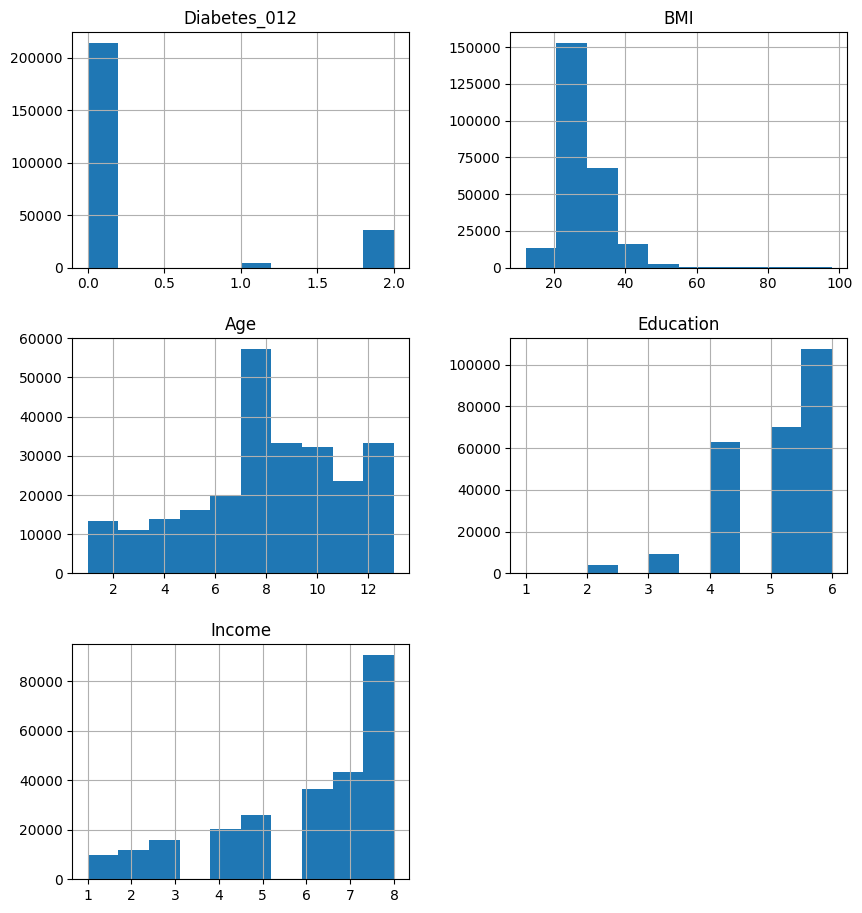

In [ ]:
# Understanding distribution of data by plotting histogram of numerical columns
Diabetes_df[['Diabetes_012','BMI','Age','Education','Income']].hist(figsize=(10,11))
plt.xticks(rotation=90)
plt.show()


Educated & High income people have participated in the survey, because they have telephone access.

#### Checking Missing Values

In [ ]:
# Checking null vlaues or missing values
print("Checking Null Values\n")
print(Diabetes_df.isnull().sum())
print("--------------------------------")
print("Checking Missing/NA Values\n")
print(Diabetes_df.isna().sum())

Checking Null Values

Diabetes_012            0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64
--------------------------------
Checking Missing/NA Values

Diabetes_012            0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare       

#### Correlation

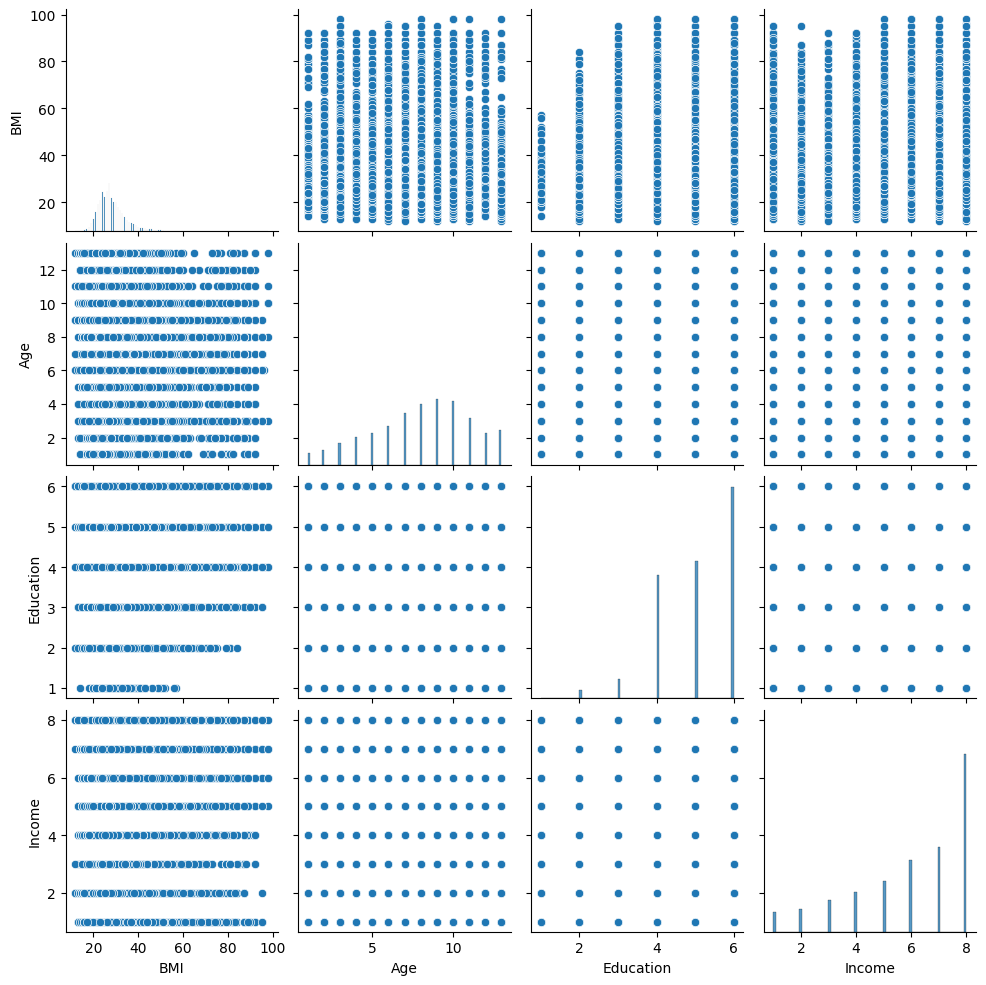

In [ ]:
# Checking relationships between the variables.
sns.pairplot(Diabetes_df[['BMI','Age','Education','Income']])
plt.show()

Since more features are binary and nominal data, so scatter plot is not giving much information

#### Outliers

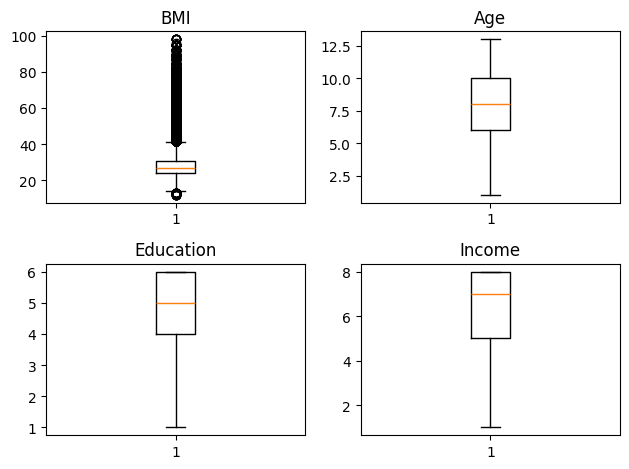

In [ ]:
# Checking outliers in features

fig, axs = plt.subplots(2,2)
axs[0,0].boxplot(Diabetes_df['BMI'])
axs[0,0].set_title("BMI")
axs[0,1].boxplot(Diabetes_df['Age'])
axs[0,1].set_title("Age")
axs[1,0].boxplot(Diabetes_df['Education'])
axs[1,0].set_title("Education")
axs[1,1].boxplot(Diabetes_df['Income'])
axs[1,1].set_title("Income")

fig.tight_layout()
plt.show()

#### No of Persons by Gender and Diabetes Condition

In [ ]:
# Showing bar plot by Gender
group_data = Diabetes_df.groupby(['Sex','Diabetes_012']).size().reset_index(name='Count')
group_data['Diabetes_Condition'] =  group_data['Diabetes_012'].apply(lambda x : '0.No Diabetes' if x == 0 else ('1.Pre-Diabetes' if x == 1 else '2.Diabetes'))

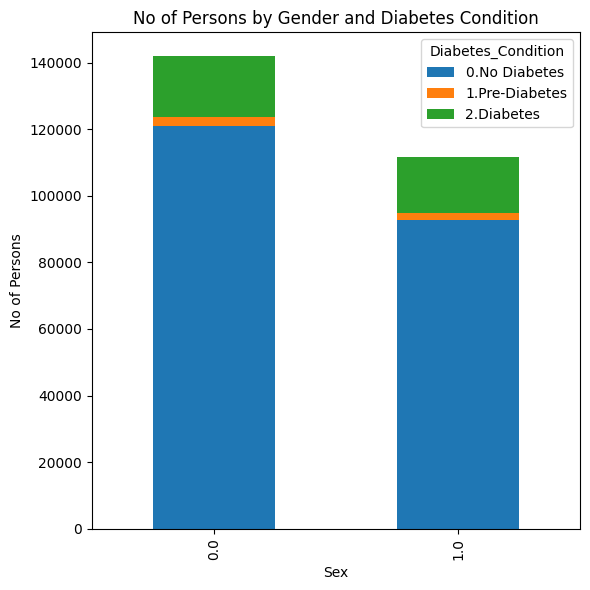

In [ ]:
# Creating pivot table for Stacked bar chart
group_data_pivot = group_data.pivot(index='Sex',columns='Diabetes_Condition',values='Count').fillna(0)
group_data_pivot.plot(kind='bar',stacked=True, figsize=(6,6))
plt.xlabel('Sex')
plt.ylabel('No of Persons')
plt.title('No of Persons by Gender and Diabetes Condition')

plt.legend(title='Diabetes_Condition')
plt.tight_layout()

## Association Rules
**Finding Most Common Health Indicators causing Diabetes using Apriori**

In this we are planning to Find Patterns & Associations between indicators for causing type of Diabetes,
and Any unusual patterns in health indicators combination, which causing diabetes


#### Pre-Processing: Feature Selection for Association Rule Mining

In [ ]:
# Creating Three new columns for understanding patterns in each Diabetes type
Diabetes_df['NoDiabetes'] = Diabetes_df['Diabetes_012'].apply(lambda x: 1 if x==0 else 0)
Diabetes_df['PreDiabetes'] = Diabetes_df['Diabetes_012'].apply(lambda x: 1 if x==1 else 0)
Diabetes_df['Diabetes'] = Diabetes_df['Diabetes_012'].apply(lambda x: 1 if x==2 else 0)

In [ ]:
# Creating seperate columns for Male & Female
Diabetes_df['Male'] = Diabetes_df['Sex'].apply(lambda x: 1 if x==1 else 0)
Diabetes_df['Female'] = Diabetes_df['Sex'].apply(lambda x: 1 if x==0 else 0)

In [ ]:
# Adding new column for General Health Indicator
# Logic: if Gen Health <= 3 Good else Bad Health
Diabetes_df['Gen Health'] = Diabetes_df['GenHlth'].apply(lambda x: 1 if x<=3 else 0)

In [ ]:
Diabetes_df.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,Sex,Age,Education,Income,NoDiabetes,PreDiabetes,Diabetes,Male,Female,Gen Health
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,0.0,9.0,4.0,3.0,1,0,0,0,1,0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,7.0,6.0,1.0,1,0,0,0,1,1
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,0.0,9.0,4.0,8.0,1,0,0,0,1,0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,0.0,11.0,3.0,6.0,1,0,0,0,1,1
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,0.0,11.0,5.0,4.0,1,0,0,0,1,1


#### No Diabetes
##### Checking Association between the health indicators for No Diabetes, using below features for No Diabetes association rule minig.

In [ ]:
# Importing Packages for Association Rules
!pip install mlxtend
!pip install --index-url https://test.pypi.org/simple/ PyARMViz

Looking in indexes: https://test.pypi.org/simple/
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 79.9 MB/s eta 0:00:00


In [ ]:
Assoc_Rule_Features_No_Dia = ['NoDiabetes','HighBP','HighChol','CholCheck','Smoker','Stroke',
'HeartDiseaseorAttack','PhysActivity','HvyAlcoholConsump','DiffWalk','Male','Female','Veggies','Gen Health']
Diabetes_Assoc_No_Dia_df = Diabetes_df[Diabetes_df['NoDiabetes']==1][Assoc_Rule_Features_No_Dia]

In [ ]:
Diabetes_Assoc_No_Dia_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 213703 entries, 0 to 253678
Data columns (total 14 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   NoDiabetes            213703 non-null  int64  
 1   HighBP                213703 non-null  float64
 2   HighChol              213703 non-null  float64
 3   CholCheck             213703 non-null  float64
 4   Smoker                213703 non-null  float64
 5   Stroke                213703 non-null  float64
 6   HeartDiseaseorAttack  213703 non-null  float64
 7   PhysActivity          213703 non-null  float64
 8   HvyAlcoholConsump     213703 non-null  float64
 9   DiffWalk              213703 non-null  float64
 10  Male                  213703 non-null  int64  
 11  Female                213703 non-null  int64  
 12  Veggies               213703 non-null  float64
 13  Gen Health            213703 non-null  int64  
dtypes: float64(10), int64(4)
memory usage: 24.5 MB


##### By using Apriori algorithm, creating most frequent itemsets of health indicators of No Diabetes condition

In [ ]:
# By using apriori algorithm, creating itemsets with support 0.25
Most_Comm_Indicators_No_Dia = apriori(Diabetes_Assoc_No_Dia_df, min_support=0.25, use_colnames=True)

# There are lot of item sets, and displaying taking time. so we are showing only top 20.
Most_Comm_Indicators_No_Dia.head(20)

,support,itemsets
0,1.000000,(NoDiabetes)
1,0.371132,(HighBP)
2,0.379171,(HighChol)
3,0.957104,(CholCheck)
4,0.429680,(Smoker)
5,0.779077,(PhysActivity)
6,0.433985,(Male)
7,0.566015,(Female)
8,0.821439,(Veggies)
9,0.869412,(Gen Health)


##### Sorting the frequent item sets

In [ ]:
# Sorting itemsets in descending order
Most_Comm_Indicators_No_Dia.sort_values(['support'], ascending=False).head(20)

,support,itemsets
0,1.000000,(NoDiabetes)
3,0.957104,(CholCheck)
12,0.957104,"(NoDiabetes, CholCheck)"
9,0.869412,(Gen Health)
18,0.869412,"(NoDiabetes, Gen Health)"
32,0.830592,"(Gen Health, CholCheck)"
58,0.830592,"(NoDiabetes, Gen Health, CholCheck)"
17,0.821439,"(NoDiabetes, Veggies)"
8,0.821439,(Veggies)
57,0.786989,"(NoDiabetes, Veggies, CholCheck)"


#### Diabetes
##### Checking Association between the health indicators for Diabetes Condition, using below features for Diabetes association rule minig.

In [ ]:
# Creating features to understand relationship & rules between indicators
Assoc_Rule_Features_Dia = ['Diabetes','HighBP','HighChol','CholCheck','Smoker','Stroke',
'HeartDiseaseorAttack','PhysActivity','HvyAlcoholConsump','DiffWalk','Male','Female','Veggies','Gen Health']
Diabetes_Assoc_Dia_df = Diabetes_df[Diabetes_df['Diabetes']==1][Assoc_Rule_Features_Dia]

In [ ]:
Diabetes_Assoc_Dia_df.shape

(35346, 14)

In [ ]:
Diabetes_Assoc_Dia_df.describe()

,Diabetes,HighBP,HighChol,CholCheck,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,HvyAlcoholConsump,DiffWalk,Male,Female,Veggies,Gen Health
count,35346.0,35346.000000,35346.000000,35346.000000,35346.000000,35346.000000,35346.000000,35346.000000,35346.000000,35346.000000,35346.000000,35346.000000,35346.000000,35346.000000
mean,1.0,0.752674,0.670118,0.993182,0.518220,0.092457,0.222882,0.630538,0.023539,0.371216,0.479121,0.520879,0.756408,0.593504
std,0.0,0.431464,0.470177,0.082292,0.499675,0.289675,0.416186,0.482666,0.151609,0.483137,0.499571,0.499571,0.429255,0.491186
min,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,1.0,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
75%,1.0,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
# Creating health indicator itemssets with support 0.1
Most_Comm_Indicators_Dia = apriori(Diabetes_Assoc_Dia_df, min_support=0.1, use_colnames=True)
Most_Comm_Indicators_Dia.head(20)

,support,itemsets
0,1.000000,(Diabetes)
1,0.752674,(HighBP)
2,0.670118,(HighChol)
3,0.993182,(CholCheck)
4,0.518220,(Smoker)
5,0.222882,(HeartDiseaseorAttack)
6,0.630538,(PhysActivity)
7,0.371216,(DiffWalk)
8,0.479121,(Male)
9,0.520879,(Female)


In [ ]:
# Displaying High Support itemsets
Most_Comm_Indicators_Dia.sort_values(['support'], ascending=False).head(30)

,support,itemsets
0,1.000000,(Diabetes)
3,0.993182,(CholCheck)
14,0.993182,"(Diabetes, CholCheck)"
21,0.756408,"(Veggies, Diabetes)"
10,0.756408,(Veggies)
1,0.752674,(HighBP)
12,0.752674,"(Diabetes, HighBP)"
48,0.751514,"(Veggies, CholCheck)"
100,0.751514,"(Veggies, Diabetes, CholCheck)"
24,0.748628,"(HighBP, CholCheck)"


In [ ]:
# Displying Low Support itemsets
Most_Comm_Indicators_Dia.sort_values(['support'], ascending=False).tail(20)

,support,itemsets
797,0.101284,"(HighChol, HighBP, CholCheck, Smoker, Gen Heal..."
660,0.101284,"(Female, HighChol, Veggies, HighBP, Smoker)"
817,0.101284,"(HighChol, Diabetes, HighBP, CholCheck, Smoker..."
739,0.101284,"(Female, HighChol, Veggies, Diabetes, HighBP, ..."
282,0.101115,"(Gen Health, Diabetes, DiffWalk, HighBP)"
163,0.101115,"(Gen Health, HighBP, DiffWalk)"
825,0.101086,"(Female, HighChol, DiffWalk, Veggies, Diabetes..."
805,0.101086,"(Female, HighChol, DiffWalk, Veggies, HighBP, ..."
735,0.101030,"(HighChol, Diabetes, HighBP, Male, Smoker, Phy..."
656,0.101030,"(HighChol, HighBP, Male, Smoker, PhysActivity)"


In [ ]:
# Resetting index with itemsets
Most_Comm_Indicators_Dia_indexed = Most_Comm_Indicators_Dia.set_index('itemsets')
Most_Comm_Indicators_Dia_indexed.sort_values(['support'], ascending=False).head(20)

,support
itemsets,
(Diabetes),1.000000
(CholCheck),0.993182
"(Diabetes, CholCheck)",0.993182
"(Veggies, Diabetes)",0.756408
(Veggies),0.756408
(HighBP),0.752674
"(Diabetes, HighBP)",0.752674
"(Veggies, CholCheck)",0.751514
"(Veggies, Diabetes, CholCheck)",0.751514


In [ ]:
Most_Comm_Indicators_Dia_indexed.sort_values(['support'], ascending=False).tail(20)

,support
itemsets,
"(HighChol, HighBP, CholCheck, Smoker, Gen Health, PhysActivity)",0.101284
"(Female, HighChol, Veggies, HighBP, Smoker)",0.101284
"(HighChol, Diabetes, HighBP, CholCheck, Smoker, Gen Health, PhysActivity)",0.101284
"(Female, HighChol, Veggies, Diabetes, HighBP, Smoker)",0.101284
"(Gen Health, Diabetes, DiffWalk, HighBP)",0.101115
"(Gen Health, HighBP, DiffWalk)",0.101115
"(Female, HighChol, DiffWalk, Veggies, Diabetes, HighBP, CholCheck)",0.101086
"(Female, HighChol, DiffWalk, Veggies, HighBP, CholCheck)",0.101086
"(HighChol, Diabetes, HighBP, Male, Smoker, PhysActivity)",0.101030


#### Plotting Diabetes itemsets with support

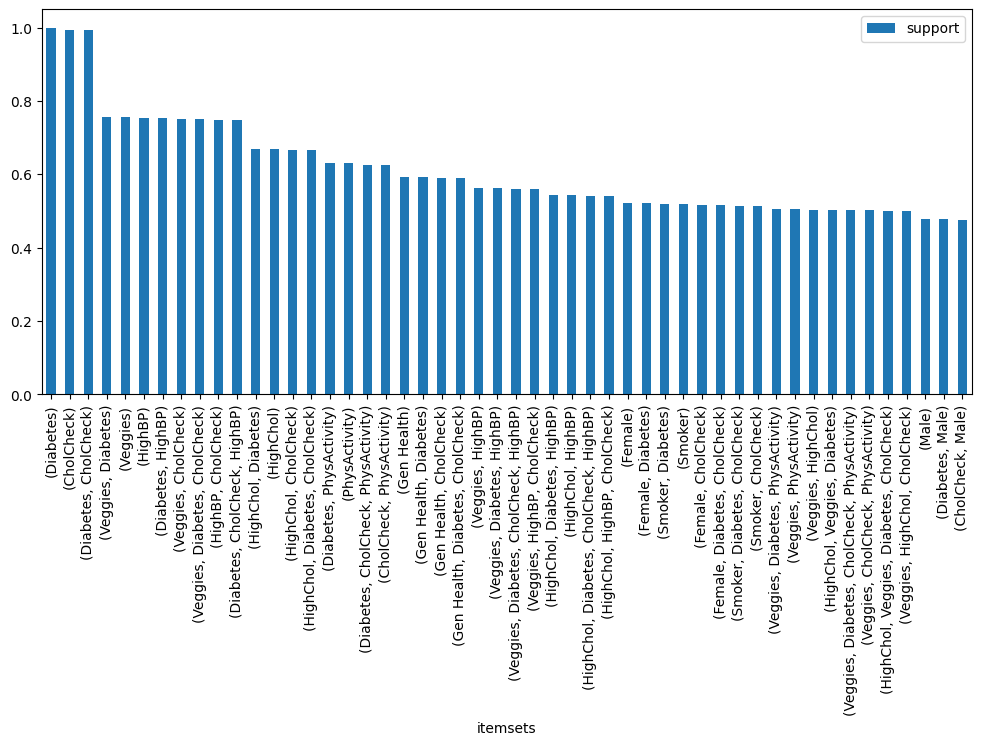

In [ ]:
# Top 50 item sets with support
Most_Comm_Indicators_Dia_indexed.sort_values(['support'], ascending=False).head(50).plot(kind='bar',figsize=(12,5))
plt.show()

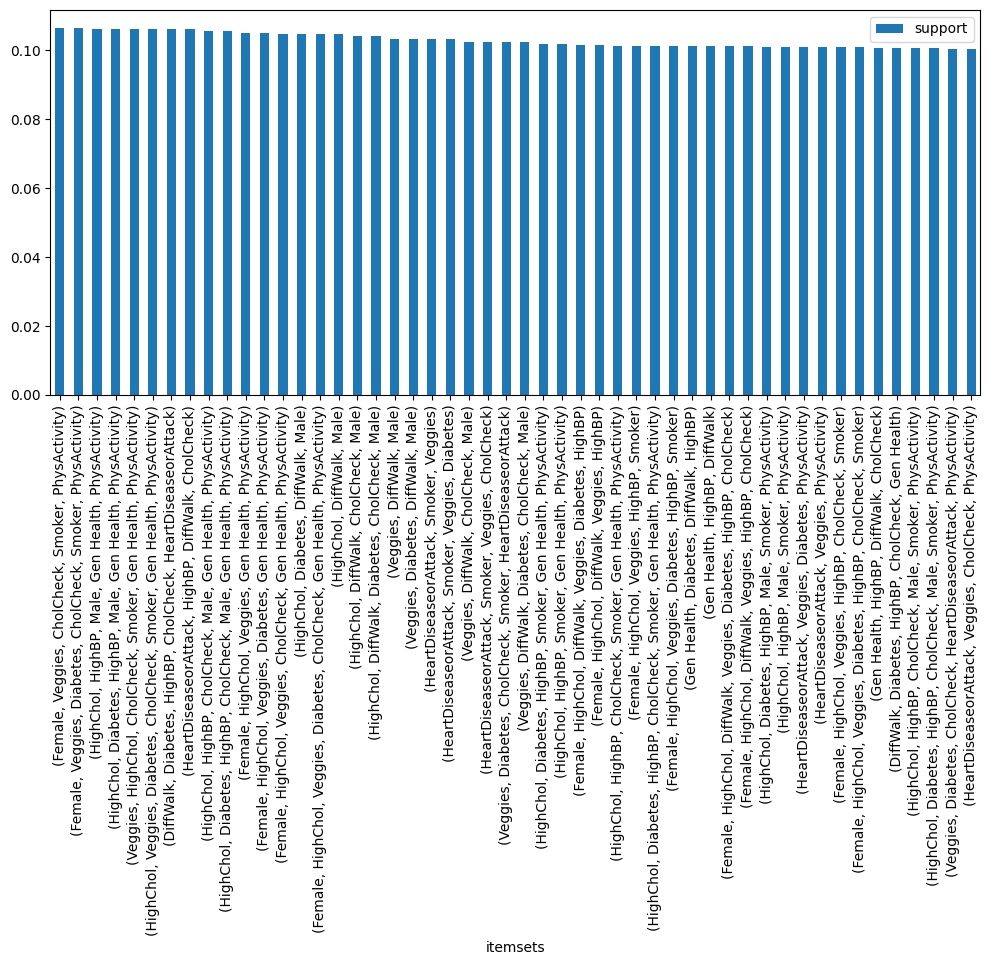

In [ ]:
# Bottom 50 item sets with support
Most_Comm_Indicators_Dia_indexed.sort_values(['support'], ascending=False).tail(50).plot(kind='bar',figsize=(12,5))
plt.show()

#### Association Rules from frequent sets

selecting rules based on minimum **confidence=0.4** and minimum **itemsets=10**

In [ ]:
Dia_rules = association_rules(Most_Comm_Indicators_Dia, metric="confidence", min_threshold=0.4, num_itemsets = 10)
Dia_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(Diabetes),(HighBP),1.000000,0.752674,0.752674,0.752674,1.000000,1.0,0.000000,1.000000,0.000000,0.752674,0.000000,0.876337
1,(HighBP),(Diabetes),0.752674,1.000000,0.752674,1.000000,1.000000,1.0,0.000000,inf,0.000000,0.752674,0.000000,0.876337
2,(HighChol),(Diabetes),0.670118,1.000000,0.670118,1.000000,1.000000,1.0,0.000000,inf,0.000000,0.670118,0.000000,0.835059
3,(Diabetes),(HighChol),1.000000,0.670118,0.670118,0.670118,1.000000,1.0,0.000000,1.000000,0.000000,0.670118,0.000000,0.835059
4,(Diabetes),(CholCheck),1.000000,0.993182,0.993182,0.993182,1.000000,1.0,0.000000,1.000000,0.000000,0.993182,0.000000,0.996591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10206,"(Female, HighChol, Gen Health)","(Diabetes, Veggies, CholCheck, PhysActivity)",0.187546,0.501896,0.104764,0.558606,1.112993,1.0,0.010636,1.128481,0.124957,0.179183,0.113853,0.383672
10207,"(Female, HighChol, PhysActivity)","(Diabetes, Gen Health, Veggies, CholCheck)",0.204521,0.460137,0.104764,0.512242,1.113239,1.0,0.010657,1.106826,0.127873,0.187115,0.096516,0.369962
10208,"(Female, Veggies, Gen Health)","(Diabetes, HighChol, CholCheck, PhysActivity)",0.232473,0.412069,0.104764,0.450651,1.093629,1.0,0.008969,1.070232,0.111545,0.194088,0.065623,0.352445
10209,"(Female, Veggies, PhysActivity)","(Diabetes, Gen Health, HighChol, CholCheck)",0.251231,0.375601,0.104764,0.417005,1.110232,1.0,0.010402,1.071018,0.132601,0.200672,0.066309,0.347964


In [ ]:
Dia_rules.to_csv('Dia_rules.csv', index=False)


#### Diabetes Rules - support vs. confidence

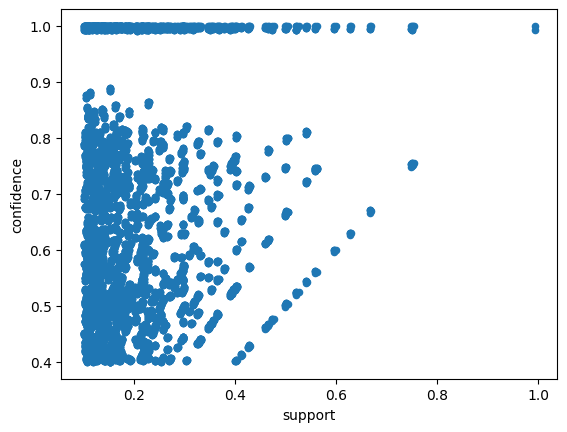

In [ ]:
Dia_rules.plot.scatter(x='support',y='confidence')
plt.show()

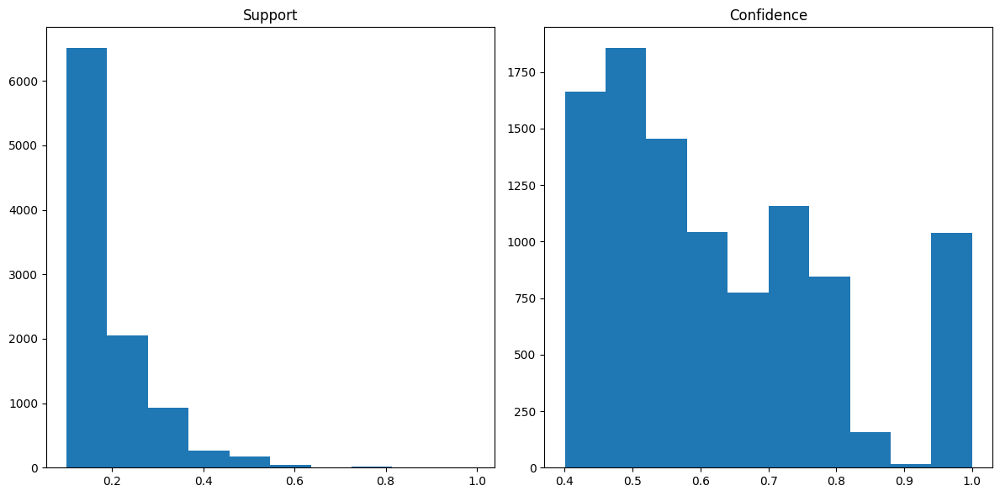

In [ ]:
# Understanding distribution of itemsets by Support & Confidence

fig, axs = plt.subplots(1,2,figsize=(12,6))
axs[0].hist(Dia_rules['support'])
axs[1].hist(Dia_rules['confidence'])
axs[0].set_title("Support")
axs[1].set_title("Confidence")

fig.tight_layout()
plt.grid(False)
plt.show()

**selecting rules based on minimum **lift=1.25****

In [ ]:
Dia_rules_lift = association_rules(Most_Comm_Indicators_Dia, metric="lift", min_threshold=1.25, num_itemsets = 5)
Dia_rules_lift

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(HeartDiseaseorAttack),(DiffWalk),0.224536,0.370041,0.121017,0.538964,1.456498,1.0,0.037929,1.366399,0.404173,0.255546,0.268149,0.433000
1,(DiffWalk),(HeartDiseaseorAttack),0.370041,0.224536,0.121017,0.327035,1.456498,1.0,0.037929,1.152311,0.497527,0.255546,0.132179,0.433000
2,"(HeartDiseaseorAttack, Diabetes)",(DiffWalk),0.224536,0.370041,0.121017,0.538964,1.456498,1.0,0.037929,1.366399,0.404173,0.255546,0.268149,0.433000
3,"(Diabetes, DiffWalk)",(HeartDiseaseorAttack),0.370041,0.224536,0.121017,0.327035,1.456498,1.0,0.037929,1.152311,0.497527,0.255546,0.132179,0.433000
4,(HeartDiseaseorAttack),"(Diabetes, DiffWalk)",0.224536,0.370041,0.121017,0.538964,1.456498,1.0,0.037929,1.366399,0.404173,0.255546,0.268149,0.433000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367,"(HighBP, PhysActivity, Smoker)","(Veggies, Diabetes, CholCheck, Male)",0.236664,0.350496,0.106184,0.448670,1.280098,1.0,0.023234,1.178067,0.286650,0.220768,0.151152,0.375812
368,"(Veggies, Diabetes, Male)","(HighBP, PhysActivity, CholCheck, Smoker)",0.353162,0.235390,0.106184,0.300667,1.277317,1.0,0.023054,1.093343,0.335647,0.220131,0.085374,0.375883
369,"(HighBP, Veggies, Male)","(PhysActivity, Diabetes, CholCheck, Smoker)",0.261965,0.316466,0.106184,0.405338,1.280823,1.0,0.023281,1.149448,0.297076,0.224849,0.130017,0.370434
370,"(PhysActivity, Smoker)","(CholCheck, Male, Diabetes, Veggies, HighBP)",0.318591,0.260497,0.106184,0.333293,1.279451,1.0,0.023192,1.109188,0.320534,0.224536,0.098439,0.370457


#### Visualization of the rules

In [ ]:
from PyARMViz import datasets
from PyARMViz import PyARMViz
from PyARMViz import Rule

In [ ]:
Dia_rules_lift

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(HeartDiseaseorAttack),(DiffWalk),0.224536,0.370041,0.121017,0.538964,1.456498,1.0,0.037929,1.366399,0.404173,0.255546,0.268149,0.433000
1,(DiffWalk),(HeartDiseaseorAttack),0.370041,0.224536,0.121017,0.327035,1.456498,1.0,0.037929,1.152311,0.497527,0.255546,0.132179,0.433000
2,"(HeartDiseaseorAttack, Diabetes)",(DiffWalk),0.224536,0.370041,0.121017,0.538964,1.456498,1.0,0.037929,1.366399,0.404173,0.255546,0.268149,0.433000
3,"(Diabetes, DiffWalk)",(HeartDiseaseorAttack),0.370041,0.224536,0.121017,0.327035,1.456498,1.0,0.037929,1.152311,0.497527,0.255546,0.132179,0.433000
4,(HeartDiseaseorAttack),"(Diabetes, DiffWalk)",0.224536,0.370041,0.121017,0.538964,1.456498,1.0,0.037929,1.366399,0.404173,0.255546,0.268149,0.433000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367,"(HighBP, PhysActivity, Smoker)","(Veggies, Diabetes, CholCheck, Male)",0.236664,0.350496,0.106184,0.448670,1.280098,1.0,0.023234,1.178067,0.286650,0.220768,0.151152,0.375812
368,"(Veggies, Diabetes, Male)","(HighBP, PhysActivity, CholCheck, Smoker)",0.353162,0.235390,0.106184,0.300667,1.277317,1.0,0.023054,1.093343,0.335647,0.220131,0.085374,0.375883
369,"(HighBP, Veggies, Male)","(PhysActivity, Diabetes, CholCheck, Smoker)",0.261965,0.316466,0.106184,0.405338,1.280823,1.0,0.023281,1.149448,0.297076,0.224849,0.130017,0.370434
370,"(PhysActivity, Smoker)","(CholCheck, Male, Diabetes, Veggies, HighBP)",0.318591,0.260497,0.106184,0.333293,1.279451,1.0,0.023192,1.109188,0.320534,0.224536,0.098439,0.370457


#### Covert rules DataFrame to Rules list for PyARMViz package

In [ ]:
def convert_rules_df_viz_rules(rules_df, num_trans):
    rules_list = []
    rule_dict = {'lhs':(), 'rhs':(), 'count_full':(), 'count_lhs':(), 'count_rhs':(), 'num_transactions':()}
    for index, row in Dia_rules_lift.iterrows():
        antec = tuple(row['antecedents'])
        conseq = list(row['consequents'])
        count_full = row['support']*num_trans
        count_lhs = row['antecedent support']*num_trans
        count_rhs = row['consequent support']*num_trans
        rule_dict['lhs']= antec
        rule_dict['rhs']= conseq
        rule_dict['count_full']= count_full
        rule_dict['count_lhs']= count_lhs
        rule_dict['count_rhs']= count_rhs
        rule_dict['num_transactions'] = num_trans
        rules_list.append(Rule.generate_rule_from_dict(rule_dict))

    return rules_list

In [ ]:
# Number of transactions from the original dataset
num_trans = Diabetes_df.shape[0]
Dia_rules_list = convert_rules_df_viz_rules(Dia_rules_lift, num_trans)

In [ ]:
# Displaying top 20 rules list
Dia_rules_list[0:20]

[{HeartDiseaseorAttack} -> {DiffWalk},
 {DiffWalk} -> {HeartDiseaseorAttack},
 {HeartDiseaseorAttack, Diabetes} -> {DiffWalk},
 {Diabetes, DiffWalk} -> {HeartDiseaseorAttack},
 {HeartDiseaseorAttack} -> {Diabetes, DiffWalk},
 {DiffWalk} -> {HeartDiseaseorAttack, Diabetes},
 {HighChol, HighBP} -> {HeartDiseaseorAttack},
 {HeartDiseaseorAttack} -> {HighChol, HighBP},
 {HighBP, Smoker} -> {HeartDiseaseorAttack},
 {HeartDiseaseorAttack} -> {HighBP, Smoker},
 {HighBP, HeartDiseaseorAttack} -> {DiffWalk},
 {HighBP, DiffWalk} -> {HeartDiseaseorAttack},
 {HeartDiseaseorAttack} -> {HighBP, DiffWalk},
 {DiffWalk} -> {HighBP, HeartDiseaseorAttack},
 {HighBP, Male} -> {HeartDiseaseorAttack},
 {HeartDiseaseorAttack} -> {HighBP, Male},
 {HighChol, Smoker} -> {HeartDiseaseorAttack},
 {HeartDiseaseorAttack} -> {HighChol, Smoker},
 {HeartDiseaseorAttack, CholCheck} -> {DiffWalk},
 {DiffWalk, CholCheck} -> {HeartDiseaseorAttack}]

In [ ]:
Dia_fig = PyARMViz.generate_rule_strength_plot(Dia_rules_list, allow_compound_flag=True)

In [ ]:
# Modified based on PyARMViz.py file from the package
from typing import List
import plotly.graph_objects as go
def generate_rule_start_end_plot_lift(rules:List, notebook_flag:bool = False, dot_size:int = 10):
    unique_values = set()
    x_axis = []
    y_axis = []
    strength = []
    for index, rule in enumerate(rules):
        x_axis.append(str(rule.rhs))
        y_axis.append(str(rule.lhs))
        strength.append(dot_size*rule.lift)
        unique_values.add(str(rule.rhs))
        unique_values.add(str(rule.lhs))

    #Generate distance matrix view
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=x_axis,
        y=y_axis,
        mode="markers",
        marker = {'size':strength},
        name='Association rules',
    ))

    fig.update_layout(
    width=1000,   # Width in pixels
    height=1000   # Height in pixels
    )


    fig.show()
    return fig

In [ ]:
# Creating scatter mapping of itemsets with lift metric as size of bubble
Dia_fig_2 = PyARMViz.generate_rule_start_end_plot(Dia_rules_list)

In [ ]:
Dia_fig_3 = generate_rule_start_end_plot_lift(Dia_rules_list)

## Anomaly Detection
**Finding Anomalies/outliers of certain individuals based on the data and share these risk factors**

In [ ]:
# Importing Few packeges for Anomaly Detections
from sklearn.neighbors import LocalOutlierFactor
from sklearn import preprocessing

In [ ]:
Diabetes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_012          253680 non-null  float64
 1   HighBP                253680 non-null  float64
 2   HighChol              253680 non-null  float64
 3   CholCheck             253680 non-null  float64
 4   BMI                   253680 non-null  float64
 5   Smoker                253680 non-null  float64
 6   Stroke                253680 non-null  float64
 7   HeartDiseaseorAttack  253680 non-null  float64
 8   PhysActivity          253680 non-null  float64
 9   Fruits                253680 non-null  float64
 10  Veggies               253680 non-null  float64
 11  HvyAlcoholConsump     253680 non-null  float64
 12  AnyHealthcare         253680 non-null  float64
 13  NoDocbcCost           253680 non-null  float64
 14  GenHlth               253680 non-null  float64
 15  

In [ ]:
# Selecting Only Original Features from dataset and also removing Diabetes Conidtion
Diabetes_Anomaly_df = Diabetes_df.iloc[:,1:22]

In [ ]:
Diabetes_Anomaly_df.describe()

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000,...,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000,187170.000000
mean,0.428375,0.424785,0.962825,28.403243,0.449607,0.040733,0.094118,0.756302,0.637581,0.810199,...,0.952337,0.082086,2.504312,3.164904,4.208661,0.167511,0.438965,8.071801,5.061831,6.087797
std,0.494845,0.494312,0.189190,6.758073,0.497455,0.197672,0.291993,0.429314,0.480700,0.392144,...,0.213052,0.274496,1.066001,7.370074,8.676215,0.373432,0.496262,3.046446,0.977889,2.049904
min,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


#### Pre-Processing - Min Max Scalling

In [ ]:
# Using MinMax scaler, it will give scale range 0 to 1
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaled_Diabetes_Anomaly_df = pd.DataFrame(scaler.fit_transform(Diabetes_Anomaly_df),columns=Diabetes_Anomaly_df.columns)
scaled_Diabetes_Anomaly_df

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,1.0,1.0,1.0,0.325581,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,1.00,0.6,0.500000,1.0,0.0,0.666667,0.6,0.285714
1,0.0,0.0,0.0,0.151163,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.50,0.0,0.000000,0.0,0.0,0.500000,1.0,0.000000
2,1.0,1.0,1.0,0.186047,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,1.0,1.00,1.0,1.000000,1.0,0.0,0.666667,0.6,1.000000
3,1.0,0.0,1.0,0.174419,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,0.25,0.0,0.000000,0.0,0.0,0.833333,0.4,0.714286
4,1.0,1.0,1.0,0.139535,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,0.25,0.1,0.000000,0.0,0.0,0.833333,0.8,0.428571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1.0,1.0,1.0,0.383721,0.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,0.50,0.0,0.166667,0.0,1.0,0.333333,1.0,0.857143
253676,1.0,1.0,1.0,0.069767,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.75,0.0,0.000000,1.0,0.0,0.833333,0.2,0.428571
253677,0.0,0.0,1.0,0.186047,0.0,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.083333,0.8,0.142857
253678,1.0,0.0,1.0,0.127907,0.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,0.50,0.0,0.000000,0.0,1.0,0.500000,0.8,0.000000


#### Outlier Detection using Local Outlier Factor Method

In [ ]:
# Creating LOF model with nearest Neighbours 10 beacsue we have more data points
lof = LocalOutlierFactor(n_neighbors=10)

In [ ]:
# Predicting outliers by fitting Diabetes dataset into LOF model
Diabetes_lof_Predictions = lof.fit_predict(scaled_Diabetes_Anomaly_df)
Diabetes_lof_Scores = -lof.negative_outlier_factor_
Diabetes_lof_Scores

array([1.00063312, 1.12092989, 1.30742837, ..., 1.00434308, 1.19081783,
       1.39953772])

##### **Lof Score threshold test for 10 Neighbours**

In [ ]:
scaled_Diabetes_Anomaly_df_5_Neigh = scaled_Diabetes_Anomaly_df.copy()
scaled_Diabetes_Anomaly_df_5_Neigh['lof_Scores'] = Diabetes_lof_Scores
scaled_Diabetes_Anomaly_df_5_Neigh[scaled_Diabetes_Anomaly_df_5_Neigh['lof_Scores']>3]

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,lof_Scores
116,0.0,0.0,1.0,0.139535,1.0,0.0,1.0,1.0,1.0,1.0,...,0.0,0.00,0.000000,0.000000,0.0,0.0,0.833333,1.0,0.857143,7.515479e+00
467,0.0,0.0,1.0,0.127907,1.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.25,0.000000,0.000000,0.0,1.0,0.750000,1.0,1.000000,6.976744e+07
849,0.0,0.0,1.0,0.139535,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.50,0.000000,0.000000,0.0,1.0,0.583333,0.8,1.000000,3.059732e+00
996,0.0,0.0,1.0,0.104651,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.00,0.000000,0.200000,0.0,0.0,0.750000,0.8,1.000000,3.076134e+00
1205,0.0,0.0,1.0,0.093023,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.00,0.033333,0.000000,0.0,0.0,0.666667,1.0,1.000000,6.784862e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249368,0.0,0.0,1.0,0.104651,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.00,0.033333,0.033333,0.0,0.0,0.250000,0.8,1.000000,3.422306e+00
249482,0.0,1.0,1.0,0.139535,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.50,0.000000,0.000000,0.0,1.0,0.583333,0.6,1.000000,3.220294e+00
249967,0.0,0.0,1.0,0.116279,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.00,0.000000,0.000000,0.0,0.0,0.416667,1.0,0.857143,2.325581e+07
249980,0.0,0.0,1.0,0.151163,1.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.25,0.000000,0.000000,0.0,1.0,0.750000,1.0,1.000000,4.651163e+07


#### Distribution of Oulier Scores Entire Data

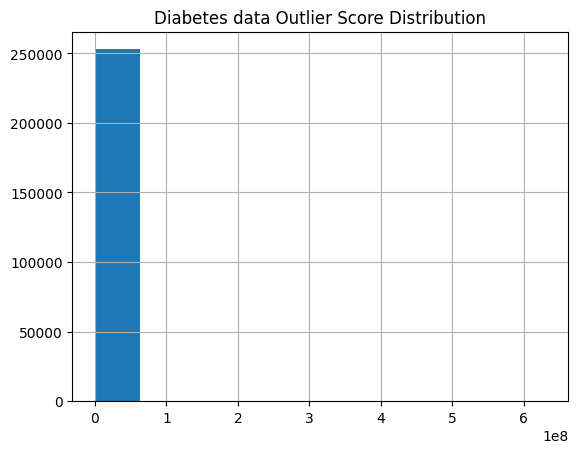

In [ ]:
# Adding Lof score column into original dataset for each row
scaled_Diabetes_Anomaly_df['lof_Scores'] = Diabetes_lof_Scores

# Creating histogram to see outlier distribution
scaled_Diabetes_Anomaly_df['lof_Scores'].hist()
plt.title("Diabetes data Outlier Score Distribution")
plt.show()

#### Distribution of Oulier Scores for Diabetes condition = 2

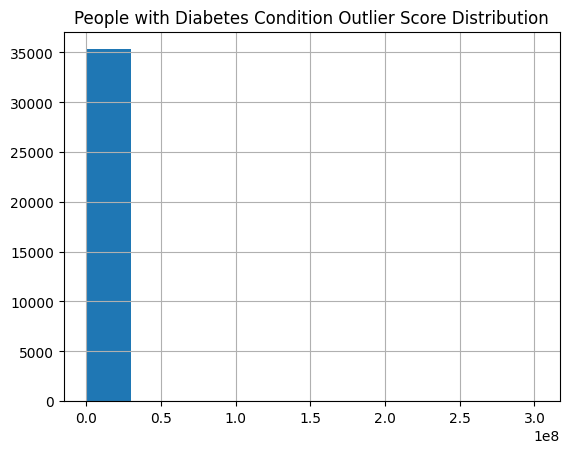

In [ ]:
# Adding Lof score column into original dataset for each row
scaled_Diabetes_Anomaly_df_2 = scaled_Diabetes_Anomaly_df.copy()
scaled_Diabetes_Anomaly_df_2['Diabetes_012'] = Diabetes_df['Diabetes_012']

# Creating histogram to see outlier distribution
scaled_Diabetes_Anomaly_df_2[scaled_Diabetes_Anomaly_df_2['Diabetes_012']==2]['lof_Scores'].hist()
plt.title("People with Diabetes Condition Outlier Score Distribution")
plt.show()

In [ ]:
scaled_Diabetes_Anomaly_df_2[(scaled_Diabetes_Anomaly_df_2['Diabetes_012']==2) & (scaled_Diabetes_Anomaly_df_2['lof_Scores']>2)]

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,lof_Scores,Diabetes_012
1542,0.0,1.0,1.0,0.197674,0.0,1.0,0.0,0.0,1.0,1.0,...,0.50,0.000000,0.000000,0.0,1.0,1.000000,0.8,0.142857,2.434912,2.0
1567,0.0,0.0,1.0,0.325581,0.0,0.0,0.0,1.0,1.0,1.0,...,0.25,0.000000,0.033333,0.0,1.0,0.500000,0.8,1.000000,2.321885,2.0
1835,1.0,0.0,1.0,0.313953,0.0,0.0,0.0,1.0,0.0,0.0,...,0.75,0.000000,0.000000,1.0,0.0,0.666667,0.6,0.285714,2.233234,2.0
2308,1.0,0.0,1.0,0.174419,0.0,0.0,0.0,1.0,0.0,1.0,...,0.25,0.000000,0.233333,0.0,0.0,0.750000,1.0,1.000000,2.147197,2.0
2365,1.0,1.0,1.0,0.395349,1.0,0.0,0.0,1.0,1.0,1.0,...,0.75,0.233333,0.233333,0.0,0.0,0.166667,0.2,0.000000,2.183150,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185891,0.0,1.0,1.0,0.313953,1.0,0.0,1.0,1.0,0.0,1.0,...,0.50,0.000000,0.000000,0.0,1.0,0.833333,0.6,0.857143,3.078113,2.0
185934,0.0,1.0,1.0,0.151163,0.0,0.0,0.0,1.0,0.0,1.0,...,0.25,0.066667,0.000000,0.0,0.0,0.833333,0.8,0.285714,2.325649,2.0
186357,1.0,1.0,1.0,0.209302,1.0,0.0,0.0,1.0,1.0,0.0,...,0.25,0.000000,0.000000,1.0,0.0,0.833333,0.8,0.285714,2.563076,2.0
186977,0.0,1.0,1.0,0.255814,0.0,0.0,1.0,1.0,0.0,1.0,...,0.50,0.000000,1.000000,0.0,1.0,0.750000,1.0,1.000000,2.673627,2.0


#### Visualizing Outliers

In [ ]:
# Adding Outlier Ind to dataframe based on LOf score > 3
scaled_Diabetes_Anomaly_df_2['Outlier_Ind'] = scaled_Diabetes_Anomaly_df_2['lof_Scores'].apply(lambda x: "Yes" if x > 3 else "No")

# Dropping Lof scores feature for visualizing pair plot
scaled_Diabetes_Anomaly_df_2_Pair = scaled_Diabetes_Anomaly_df_2.drop(['lof_Scores'],axis=1)

In [ ]:
# Creating pair plot to understnad outliers
#sns.pairplot(scaled_Diabetes_Anomaly_df_2_Pair[scaled_Diabetes_Anomaly_df_2_Pair['Diabetes_012']==2], hue = 'Outlier_Ind', diag_kind= "kde")

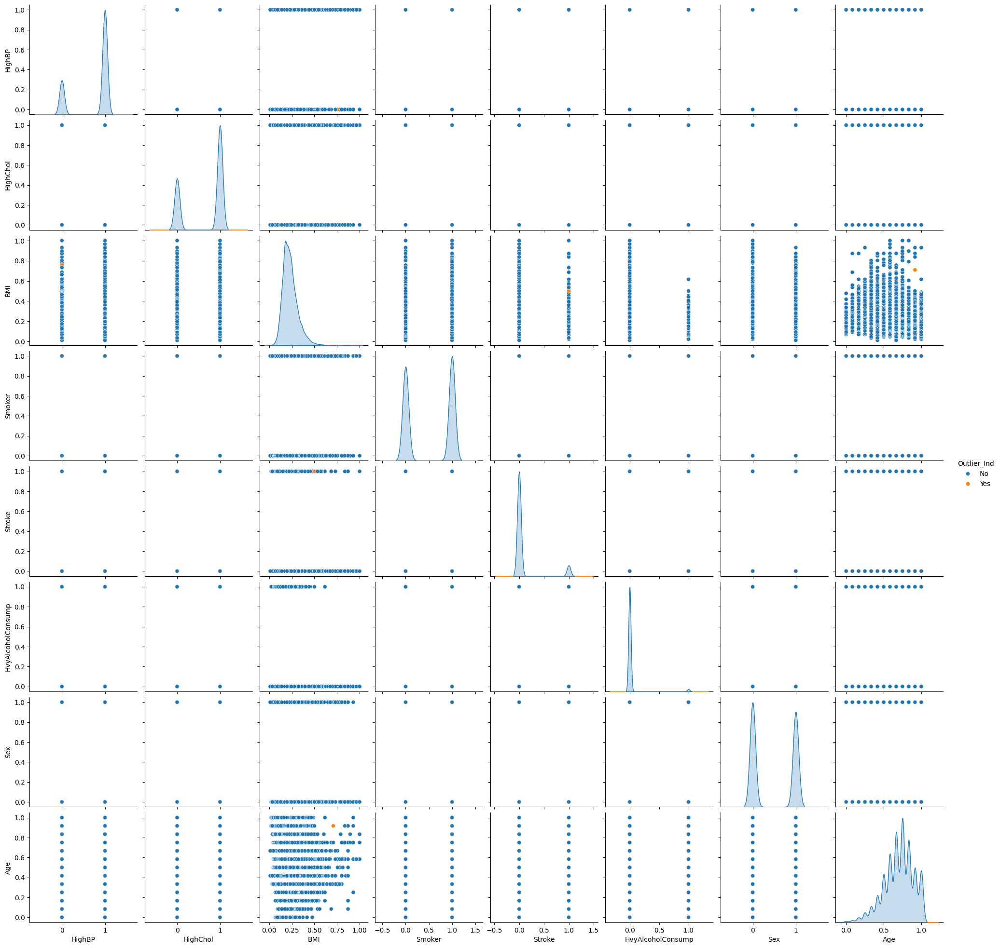

In [ ]:
sns.pairplot(scaled_Diabetes_Anomaly_df_2_Pair[scaled_Diabetes_Anomaly_df_2_Pair['Diabetes_012']==2][['HighBP','HighChol','BMI','Smoker','Stroke','HvyAlcoholConsump','Sex','Age','Outlier_Ind']], hue = 'Outlier_Ind', diag_kind= "kde")

In [ ]:
scaled_Diabetes_Anomaly_df_2[(scaled_Diabetes_Anomaly_df_2['Outlier_Ind']=="Yes") & (scaled_Diabetes_Anomaly_df_2['Diabetes_012']==2)].head()

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,lof_Scores,Diabetes_012,Outlier_Ind
5207,0.0,1.0,1.0,0.186047,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.666667,1.0,1.0,1.162791e+07,2.0,Yes
6132,0.0,0.0,1.0,0.174419,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.666667,1.0,1.0,7.037023e+00,2.0,Yes
7095,0.0,0.0,1.0,0.162791,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.666667,1.0,1.0,1.162791e+07,2.0,Yes
14439,1.0,1.0,1.0,0.186047,1.0,0.0,0.0,1.0,0.0,1.0,...,0.1,0.0,0.0,1.0,0.666667,1.0,1.0,5.553207e+00,2.0,Yes
15767,1.0,1.0,1.0,0.151163,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.750000,1.0,1.0,1.162791e+07,2.0,Yes


In [ ]:
# Exporting Outliers into CSV to Understnad data of outliers
Diabetes_df_Outliers = Diabetes_df.copy()
Diabetes_df_Outliers['Outlier_Ind'] = scaled_Diabetes_Anomaly_df_2['Outlier_Ind']
Diabetes_df_Outliers[Diabetes_df_Outliers['Outlier_Ind']=="Yes"].to_csv("Diabetes_Outliers.csv")

In [ ]:
Diabetes_df_Outliers[Diabetes_df_Outliers['Outlier_Ind']=="Yes"].shape

(1923, 29)

In [ ]:
# Importing ydata profile package
!pip install ydata_profiling

In [ ]:
# Diabetes outliers of Data Profilig
from ydata_profiling import ProfileReport
# Creating Profile Report
diabetes_profile = ProfileReport(Diabetes_df_Outliers[Diabetes_df_Outliers['Outlier_Ind']=="Yes"], title="Diabetes Outliers Profiling Report")

In [ ]:
diabetes_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Outlier Detection using PCA Method

In [ ]:
# importing PCA package from scikit Learn Package
from sklearn.decomposition import PCA

#Copying scaled data into new dataframe for PCA analysis
scaled_Diabetes_Anomaly_PCA_df = scaled_Diabetes_Anomaly_df.drop(["lof_Scores"], axis=1)
scaled_Diabetes_Anomaly_PCA_df.head()

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,1.0,1.0,1.0,0.325581,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,1.00,0.6,0.5,1.0,0.0,0.666667,0.6,0.285714
1,0.0,0.0,0.0,0.151163,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.50,0.0,0.0,0.0,0.0,0.500000,1.0,0.000000
2,1.0,1.0,1.0,0.186047,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,1.0,1.00,1.0,1.0,1.0,0.0,0.666667,0.6,1.000000
3,1.0,0.0,1.0,0.174419,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,0.25,0.0,0.0,0.0,0.0,0.833333,0.4,0.714286
4,1.0,1.0,1.0,0.139535,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,0.25,0.1,0.0,0.0,0.0,0.833333,0.8,0.428571


In [ ]:
# Creating PCA model with 2 principal Components
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_Diabetes_Anomaly_PCA_df)
Diabetes_Anomaly_PCA_df = pd.DataFrame(pca_result, columns = ['PC1', 'PC2'])
Diabetes_Anomaly_PCA_df.head()

,PC1,PC2
0,1.628322,-0.234947
1,-0.010778,0.630299
2,1.319048,-0.847772
3,-0.303422,-0.683592
4,0.148895,-0.917767


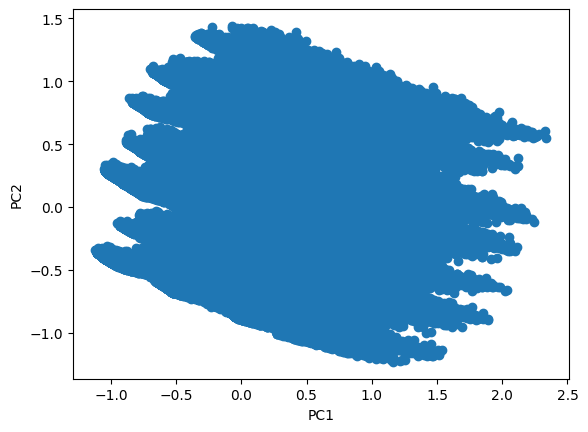

In [ ]:
# Creating scatter plot with two components
plt.scatter(Diabetes_Anomaly_PCA_df['PC1'],Diabetes_Anomaly_PCA_df['PC2'])
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

In [ ]:
# Adding outlier Ind to PCA dataframe using previous LOF scores caluclated above
Diabetes_Anomaly_PCA_df['Outlier_Ind'] = scaled_Diabetes_Anomaly_df['lof_Scores'] > 3

In [ ]:
Diabetes_Anomaly_PCA_df.head()

,PC1,PC2,Outlier_Ind
0,1.628322,-0.234947,False
1,-0.010778,0.630299,False
2,1.319048,-0.847772,False
3,-0.303422,-0.683592,False
4,0.148895,-0.917767,False


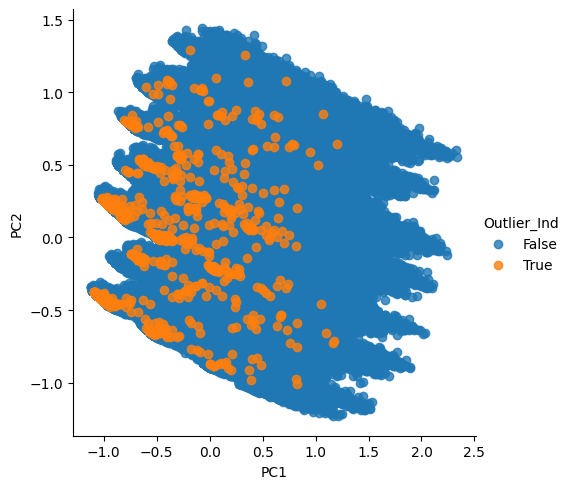

In [ ]:
# Creating same scatter plot bewteen with PC1, PC2 with color outliers
sns.lmplot(x="PC1", y="PC2", data=Diabetes_Anomaly_PCA_df, fit_reg=False, hue='Outlier_Ind')
plt.show()

By using PCA (Reduced diamesion space) we are able to differntiate outliers and normal points, may beacsue it has lot of data points or more features has high correlation or multicollinarity.

## Recommendation System
**Finding Similar persons with different Diabetes condition based given health characteristics**

In [ ]:
# Loading Dataset
Diabetes_Rec_df = pd.read_csv("diabetes_012_health_indicators_BRFSS2015.csv")

In [ ]:
# Using MinMax scaler, it will give scale range 0 to 1
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaled_Diabetes_Rec_df = pd.DataFrame(scaler.fit_transform(Diabetes_Rec_df.iloc[:,1:23]),columns=Diabetes_Rec_df.iloc[:,1:23].columns)
scaled_Diabetes_Rec_df

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,1.0,1.0,1.0,0.325581,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,1.00,0.6,0.500000,1.0,0.0,0.666667,0.6,0.285714
1,0.0,0.0,0.0,0.151163,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.50,0.0,0.000000,0.0,0.0,0.500000,1.0,0.000000
2,1.0,1.0,1.0,0.186047,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,1.0,1.00,1.0,1.000000,1.0,0.0,0.666667,0.6,1.000000
3,1.0,0.0,1.0,0.174419,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,0.25,0.0,0.000000,0.0,0.0,0.833333,0.4,0.714286
4,1.0,1.0,1.0,0.139535,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,0.25,0.1,0.000000,0.0,0.0,0.833333,0.8,0.428571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1.0,1.0,1.0,0.383721,0.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,0.50,0.0,0.166667,0.0,1.0,0.333333,1.0,0.857143
253676,1.0,1.0,1.0,0.069767,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.75,0.0,0.000000,1.0,0.0,0.833333,0.2,0.428571
253677,0.0,0.0,1.0,0.186047,0.0,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.083333,0.8,0.142857
253678,1.0,0.0,1.0,0.127907,0.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,0.50,0.0,0.000000,0.0,1.0,0.500000,0.8,0.000000


In [ ]:
# importing PCA package from scikit Learn Package
from sklearn.decomposition import PCA

#Run PCA to reduce dimensionality
pca = PCA(n_components=10)
scaled_Diabetes_Rec_pca = pca.fit_transform(scaled_Diabetes_Rec_df)

In [ ]:
# importing cosine simialrity package to find distances between points
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
# Create a function to find the nearest persons using cosine similarity
def find_nearest_persons(predict_sample, persons_database, n_neighbors=2):
    # Compute the cosine similarity
    similarities = cosine_similarity([predict_sample], persons_database)[0]
    # Get the indices of the top n_neighbors most similar persons
    nearest_indices = np.argsort(similarities)[-(n_neighbors+1):-1][::-1]
    return nearest_indices

In [ ]:
# Build the recommendation system
def similar_persons(search_person_index,random_person, scaled_Diabetes_Rec_pca,Diabetes_Rec_df, n_neighbors=2):
    # Find the nearest 2 persons using cosine similarity
    nearest_indices = find_nearest_persons(random_person, scaled_Diabetes_Rec_pca, n_neighbors)

    print("Search Person Indicators")
    print(Diabetes_Rec_df.loc[search_person_index])
    print("\n")

    print("Similar Persons for given charcterstics")
    for i in nearest_indices:
        print(Diabetes_Rec_df.loc[nearest_indices])

In [ ]:
# Selecting Random person characterstics in Data
search_person_index = 68105

# Above Persons health indicators

**Diabetes_012:    2** ,
**HighBP:    0** ,
**HighChol:    0** ,
**CholCheck:    1** ,
**BMI:    22** ,
**Smoker:    1** ,
**Stroke:    1** ,
**HeartDiseaseorAttack:    0** ,
**PhysActivity:    1** ,
**Fruits:    1** ,
**Veggies:    1** ,
**HvyAlcoholConsump:    0** ,
**AnyHealthcare:    0** ,
**NoDocbcCost:    0** ,
**GenHlth:    1** ,
**MentHlth:    0** ,
**PhysHlth:    0** ,
**DiffWalk:    0** ,
**Sex:    1** ,
**Age:    10** ,
**Education:    5**
**Income:    7** ,
**
**Income:    7**


In [ ]:
# Getting record of above person
Predict_samples = scaled_Diabetes_Rec_pca[search_person_index]

# Finding similar persons
similar_persons(search_person_index,Predict_samples,scaled_Diabetes_Rec_pca,Diabetes_Rec_df)

Search Person Indicators
Diabetes_012             2.0
HighBP                   0.0
HighChol                 0.0
CholCheck                1.0
BMI                     22.0
Smoker                   1.0
Stroke                   1.0
HeartDiseaseorAttack     0.0
PhysActivity             1.0
Fruits                   1.0
Veggies                  1.0
HvyAlcoholConsump        0.0
AnyHealthcare            0.0
NoDocbcCost              0.0
GenHlth                  1.0
MentHlth                 0.0
PhysHlth                 0.0
DiffWalk                 0.0
Sex                      1.0
Age                     10.0
Education                5.0
Income                   7.0
Name: 68105, dtype: float64


Similar Persons for given charcterstics
        Diabetes_012  HighBP  HighChol  CholCheck   BMI  Smoker  Stroke  \
89909            0.0     0.0       0.0        1.0  22.0     1.0     0.0   
171623           0.0     0.0       0.0        1.0  28.0     1.0     0.0   

        HeartDiseaseorAttack  PhysActivit